## **NMR ensemble & dynamics frustration**
In this colab we will calculate and analyze frustration patterns in an NMR ensemble of FoxP1 proteins. For this purpose we will use new functionalities of the frustratometer (R package). We will split the NMR ensemble and analyze its frustration by treating it as if it were a very brief molecular dynamics simulation.



Note: This notebook is largely based on the notebook generated for the symposium & workshop : Chaos, Panic and dis(order) in Protein Evolution by Maria Ines Freiberger and Pablo Galaz-Davison.

https://pagalaz.wixsite.com/proteinevolution2022/general-5

## **We are going to test the Frustratometer.**




We are going to install the minimum libraries to be able to run the **frustratometer** in colab!

In [ ]:
#Install biopython and visualization
!pip install biopython py3Dmol
#Downgrade rpy para correr frustraR
!pip install rpy2==3.5.1

In [ ]:
import os
os.kill(os.getpid(), 9)

In [ ]:
!apt update -y
!apt install wget mc r-base python3 python3-pip pymol libmagick++-dev libcurl4-openssl-dev libssl-dev libgit2-dev -y
!apt install libcurl4-gnutls-dev libxml2-dev -y
!python3 -m pip install numpy biopython leidenalg
!apt install software-properties-common -y
!wget https://salilab.org/modeller/9.25/modeller_9.25-1_amd64.deb
!env KEY_MODELLER=MODELIRANJE dpkg -i modeller_9.25-1_amd64.deb
!Rscript -e "install.packages('ggrepel')"
!Rscript -e "install.packages('igraph')"
!Rscript -e "install.packages('dplyr')"
!Rscript -e "install.packages('FactoMineR')"
!Rscript -e "install.packages('Hmisc')"`
!Rscript -e "install.packages('argparse')"
!Rscript -e "install.packages('leiden')"
!Rscript -e "install.packages('magick')"
!Rscript -e "options(timeout=9999999)"
!Rscript -e "devtools::install_github('proteinphysiologylab/frustratometeR')"

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:3 http://security.ubuntu.com/ubuntu jammy-security InRelease [110 kB]
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [498 kB]
Get:6 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [119 kB]
Hit:7 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:8 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Get:9 http://security.ubuntu.com/ubuntu jammy-security/main amd64 Packages [1,014 kB]
Hit:10 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Get:11 http://archive.ubuntu.com/ubuntu jammy-updates/universe amd64 Packages [1,259 kB]
Hit:12 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Get:13 http://archive.ubuntu.com/ubun

Now, we are going to **donwload the interactive version of R**  which is usefull to calculate the frustration at the contact level (mutational and configurational).

In [ ]:
#Loading the R extension interactively
%load_ext rpy2.ipython

Then we download the monomeric form of FoxP1, which is an ensemble of NMR structures.

In [ ]:
!wget http://www.rcsb.org/pdb/files/2kiu.pdb -O 2kiu.pdb


--2023-09-20 16:10:55--  http://www.rcsb.org/pdb/files/2kiu.pdb
Resolving www.rcsb.org (www.rcsb.org)... 128.6.159.248
Connecting to www.rcsb.org (www.rcsb.org)|128.6.159.248|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://www.rcsb.org/pdb/files/2kiu.pdb [following]
--2023-09-20 16:10:55--  https://www.rcsb.org/pdb/files/2kiu.pdb
Connecting to www.rcsb.org (www.rcsb.org)|128.6.159.248|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://files.rcsb.org/download/2kiu.pdb [following]
--2023-09-20 16:10:55--  https://files.rcsb.org/download/2kiu.pdb
Resolving files.rcsb.org (files.rcsb.org)... 132.249.213.193
Connecting to files.rcsb.org (files.rcsb.org)|132.249.213.193|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/octet-stream]
Saving to: ‘2kiu.pdb’

2kiu.pdb                [  <=>               ]   2.34M  6.65MB/s    in 0.4s    

2023-09-20 1

####Visualization of the structures

In [ ]:
#Visualizing the heterotetramer
import py3Dmol
#First we assign the py3Dmol.view as view
view=py3Dmol.view()
#The following lines are used to add the addModel class
#to read the PDB files of chain B and C
view.addModel(open('/content/2kiu.pdb', 'r').read(),'pdb')
#Zooming into all visualized structures
view.zoomTo()
#Here we set the background color as white
view.setBackgroundColor('white')
#Here we set the visualization style for chain B and C
view.setStyle({'chain':'A'},{'cartoon': {'color':'blue'}})
#view.setStyle({'chain':'B'},{'cartoon': {'color':'green'}})
#view.setStyle({'chain':'C'},{'cartoon': {'color':'yellow'}})
#view.setStyle({'chain':'D'},{'cartoon': {'color':'pueple'}})
#And we finally visualize the structures using the command below
view.show()

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

####Frustration calculation of FoxP

We will generate the **R script** to frustrate all the pdbs out there **in a directory**!




In [ ]:
#create a folder to save the frustration resutls
!mkdir Results

# Primero el indice mutacional :#

Now, we load the library of frustratometer and then creat a working directory, and a mutational object.

In [ ]:
%%R
library(frustratometeR)

dir_frustration(PdbsDir = "/content/", Mode = "mutational", ResultsDir ="/content/Results/")


    consider that it could be called from a Python process. This
    results in a quasi-obligatory segfault when rpy2 is evaluating
    R code using it. On the hand, rpy2 is accounting for the
    fact that it might already be running embedded in a Python
    process. This is why:
    - Python -> rpy2 -> R -> reticulate: crashes
    - R -> reticulate -> Python -> rpy2: works

    The issue with reticulate is tracked here:
    https://github.com/rstudio/reticulate/issues/208
    -----------------------------Filtering-----------------------------
-----------------------------Preparing files-----------------------------
-----------------------------Setting options-----------------------------
-----------------------------Calculating-----------------------------
-----------------------------Reorganization-----------------------------
-----------------------------Images-----------------------------
5Adens plot is stored in /content/Results/2kiu.done/Images/2kiu_mutational.png_5Adens.png
5A

### Nota : este analisis se ejecuta para conocer la frustración para cada uno de los residuos de la secuencia de FoxP.

Para conocer mas información a prori sobre FoxP1 proveniente del PDB, se usará un par de lineas del curso IBM3202. Lab02

In [ ]:
#Crear un parse para poder extraer innformación del archivo
from Bio import SeqIO, Entrez
#Setting up your email to be able to use Entrez
Entrez.email = 'simulacra.simulacion@gmail.com'                                                            ### Enter e-mail ##3
#Here, we set up a temporary handle with our downloaded sequence in fasta format
temp = Entrez.efetch(db="protein",rettype="fasta",id="2KIU_A")
#Creating a fasta file to write our downloaded sequence
aaseq_out = open("2KIU_A.fasta",'w')
#Reading the sequence information as a string in fasta format
aaseq = SeqIO.read(temp, format="fasta")
#Writing the sequence record in fasta format
SeqIO.write(aaseq,aaseq_out,"fasta")
#Closing both the temp handle and the FASTA file
temp.close()
aaseq_out.close()

La información que aqui se genera servirá para orientarse y concoer mas de las graficas correspondientes

In [ ]:
from typing import Sequence
#Printing the number of amino acids as an example
print("Sequence length (aa):")
print(len(aaseq))

#Printing the description of the sequence
print("The description of the sequence is:")
#INSERT YOUR OWN COMMAND HERE
print(aaseq.description)

#Printing the accession ID of the sequence
print("The ID of the sequence is:")
#INSERT YOUR OWN COMMAND BELOW
print(aaseq.id)

#Printing the sequence
print("The sequence is:")
#INSERT YOUR OWN COMMAND BELOW
print(aaseq.seq)

Sequence length (aa):
87
The description of the sequence is:
pdb|2KIU|A Chain A, Forkhead box protein P1
The ID of the sequence is:
pdb|2KIU|A
The sequence is:
AEVRPPFTYASLIRQAILESPEKQLTLNEIYNWFTRMFPYFRRNAATWKNAVRHNLSLHKYFVRVENVKGAVWTVDEVEFQKRRPQK


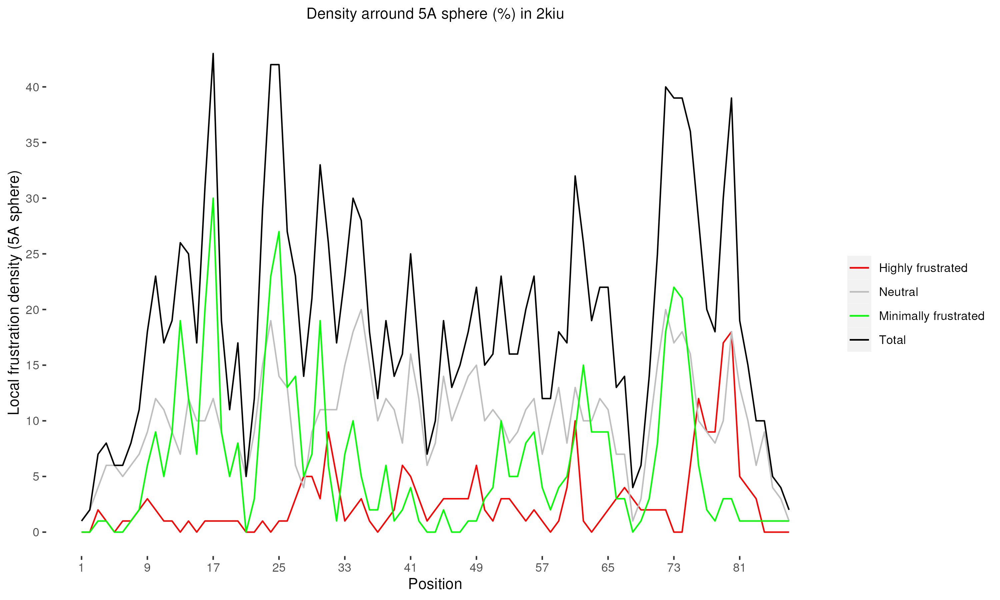

In [ ]:
Image('/content/Results/2kiu.done/Images/2kiu_mutational.png_5Adens.png', width=700, height=400)

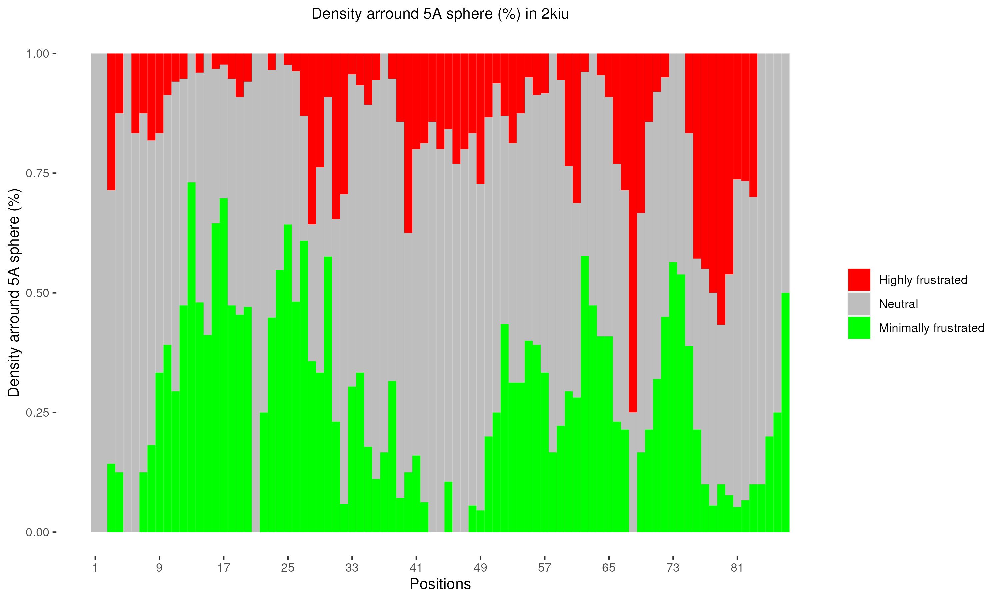

In [ ]:
Image('/content/Results/2kiu.done/Images/2kiu_mutational_5Adens_around.png', width=700, height=400)

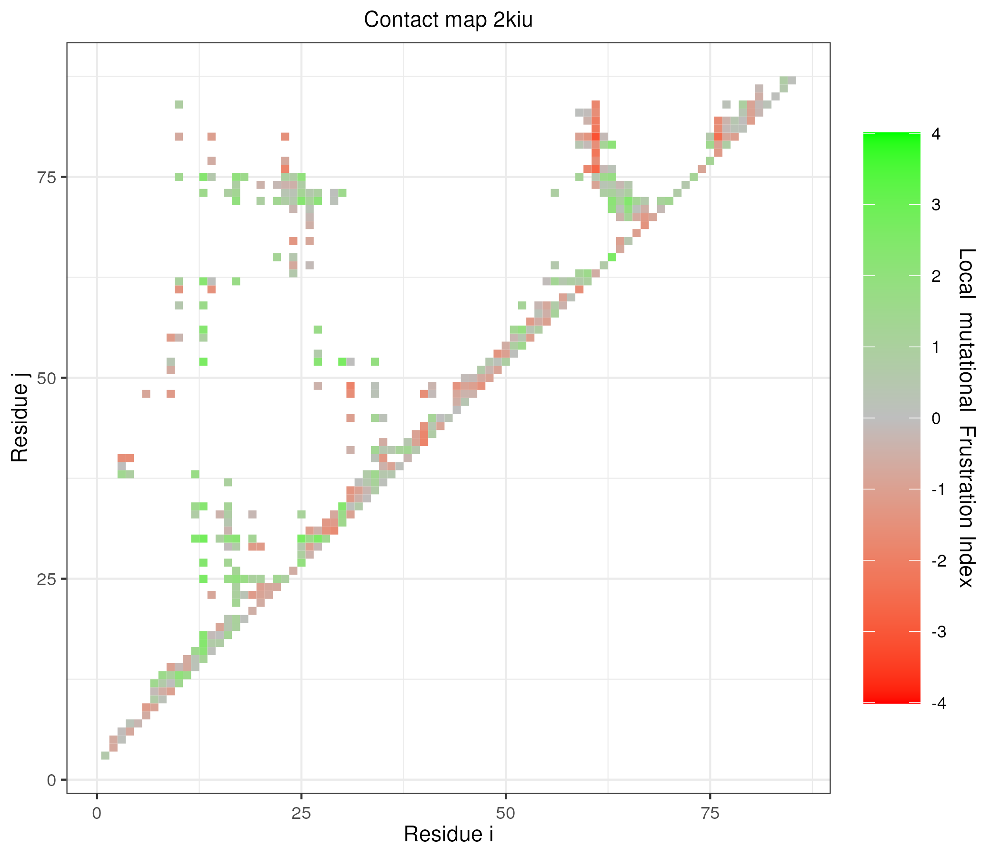

In [ ]:
from IPython.display import Image
Image('/content/Results/2kiu.done/Images/2kiu_mutational_map.png', width=500, height=500)

# Ahora el indice configurational :#

In [ ]:
%%R
library(frustratometeR)

dir_frustration(PdbsDir = "/content/", Mode = "configurational", ResultsDir ="/content/Results/")

-----------------------------Filtering-----------------------------
-----------------------------Preparing files-----------------------------
-----------------------------Setting options-----------------------------
-----------------------------Calculating-----------------------------
-----------------------------Reorganization-----------------------------
-----------------------------Images-----------------------------
5Adens plot is stored in /content/Results/2kiu.done/Images/2kiu_configurational.png_5Adens.png
5Adens proportion plot is stored in /content/Results/2kiu.done/Images/2kiu_configurational_5Adens_around.png
Contact map is stored in /content/Results/2kiu.done/Images/2kiu_configurational_map.png
-----------------------------Visualizations-----------------------------


****Storage information****
The frustration data was stored in /content/Results/2kiu.done/FrustrationData
Graphics are stored in /content/Results/2kiu.done/Images
Visualizations are stored in /content/Results/

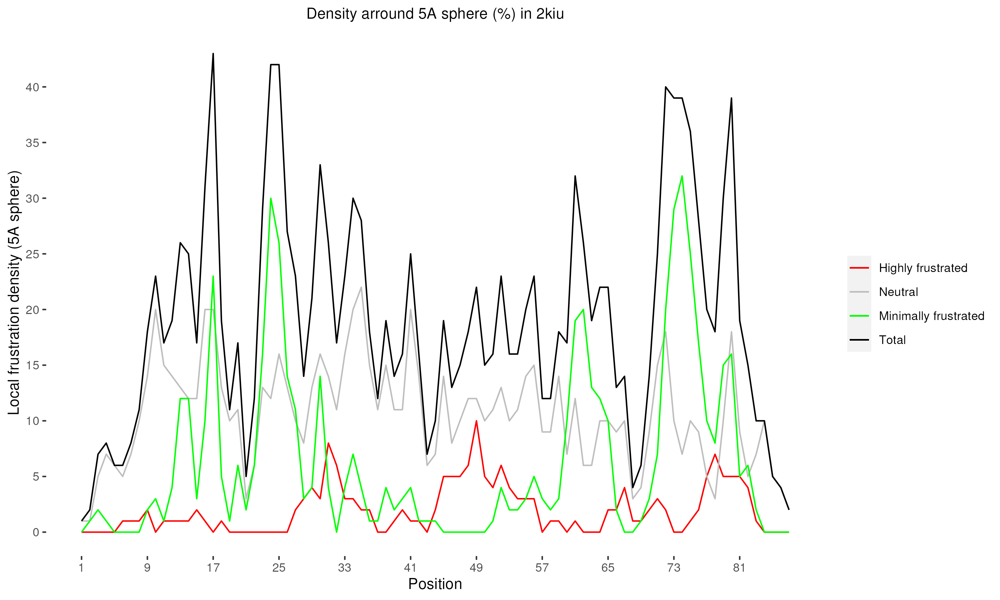

In [ ]:
Image('/content/Results/2kiu.done/Images/2kiu_configurational.png_5Adens.png', width=700, height=400)

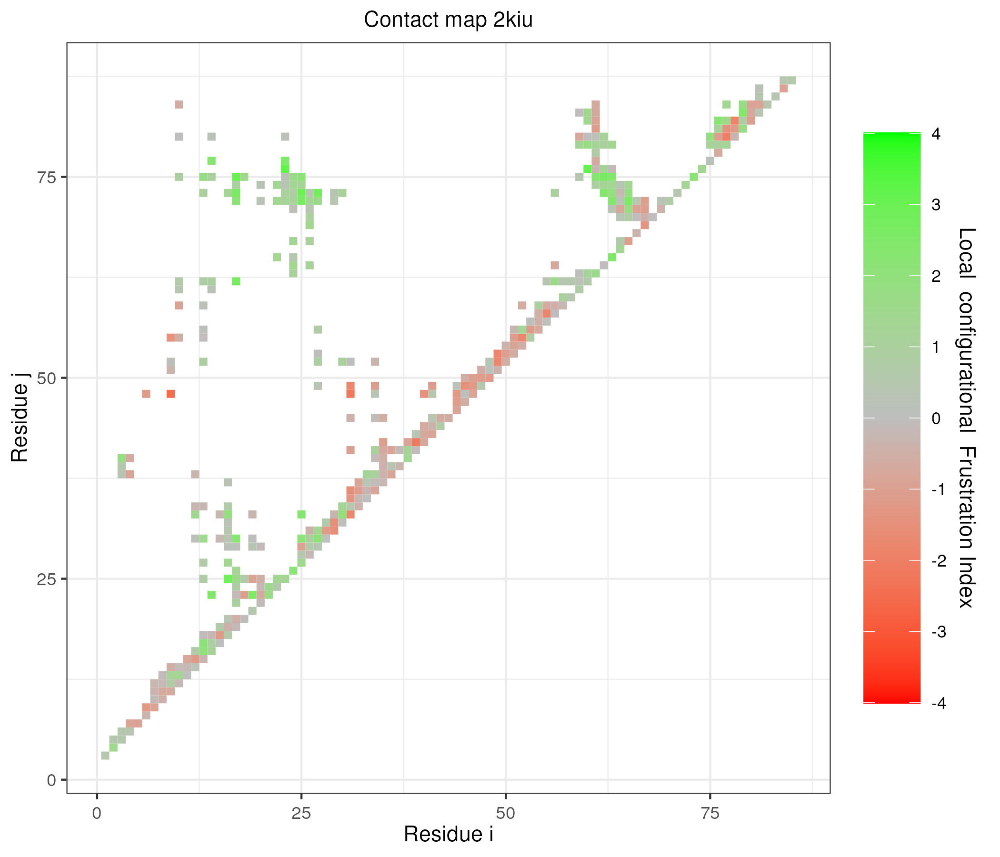

In [ ]:
from IPython.display import Image
Image('/content/Results/2kiu.done/Images/2kiu_configurational_map.png', width=500, height=500)

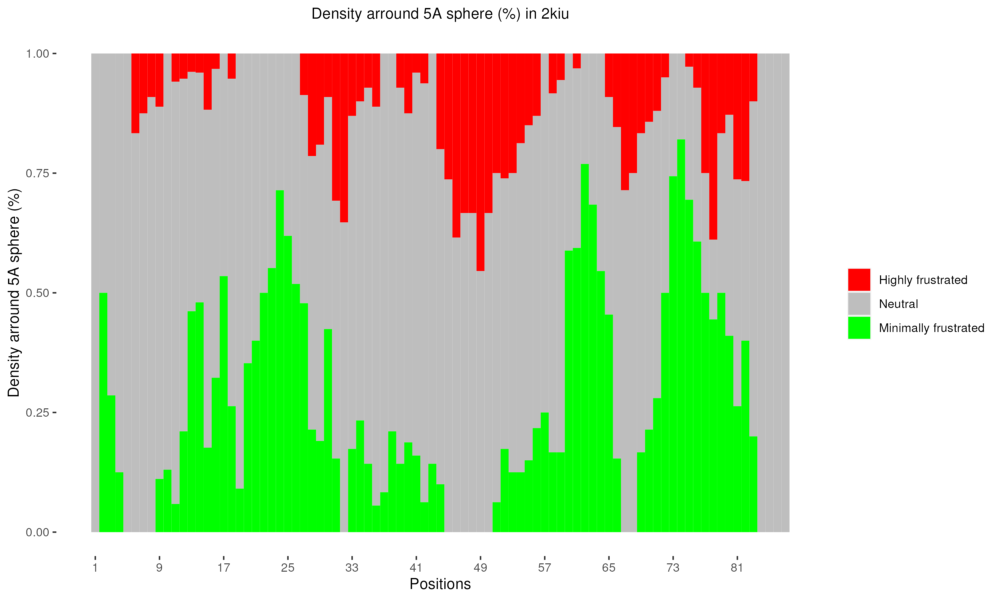

In [ ]:
Image('/content/Results/2kiu.done/Images/2kiu_configurational_5Adens_around.png', width=700, height=400)

#Frustration across NMR ensemble of FoxP1#

Now we will do the analysis for the complete set of structures obtained from PDB.

## To do the analysis we need to make a prior splitting of the ensemble, and we we do this by using the following script.

First we will make a New directory named FoxP_NMR, inside the content working directory.

In [ ]:
#Toma un ensamble de NMR de la PDB y lo particiona y enumara en varios frames del 1 al 20
from Bio import PDB
import os

pdb_parser = PDB.PDBParser(QUIET=True)
structure = pdb_parser.get_structure("modelo", "/content/2kiu.pdb")
for model_num, model in enumerate(structure):
    for submodel_num, submodel in enumerate(model):
        io = PDB.PDBIO()
        io.set_structure(submodel)
        output_file = f"/content/FoxP_NMR/2kiu{model_num + 1}.pdb"
        io.save(output_file)


In [ ]:
#Toma un ensamble de NMR de la PDB y lo particiona y enumara en varios frames del 1 al 20
from Bio import PDB
import os

pdb_parser = PDB.PDBParser(QUIET=True)
structure = pdb_parser.get_structure("modelo", "/content/2kiu.pdb")
for model_num, model in enumerate(structure):
    for submodel_num, submodel in enumerate(model):
        io = PDB.PDBIO()
        io.set_structure(submodel)
        output_file = f"/content/FoxP_NMR_/2kiu_{model_num + 1}.pdb"
        io.save(output_file)

El archivo que genera por frame es el 2kiu_1.pdb_singleresidue ##
que esta en el directorio 2kiu_1_done ##

In [ ]:
%%R
library(frustratometeR)

help(package = "frustratometeR")


File: /tmp/RtmpV86lu4/RpackageInfocc8b67c09ec5


		Information on package ‘frustratometeR’



Description:



Package:            frustratometeR

Type:               Package

Title:              frustratometeR

Version:            0.1.0

Authors:            Atilio O. Rausch*, Freiberger Maria I.*, R. Gonzalo

                    Parra

Maintainer:         Atilio O. Rausch <atiliorau@gmail.com>, Freiberger

                    Maria I. <mariaines.freiberger@gmail.com>, R.

                    Gonzalo Parra <gonzalo.parra@bsc.es>

Description:        Frustratometer: an R-package to compute Local

                    frustration in protein structures, point mutants

                    and MD simulations

License:            GPL

Encoding:           UTF-8

RoxygenNote:        7.1.1

biocViews:          

Imports:            bio3d, ggplot2, ggrepel, reshape2, dplyr, igraph,

                    FactoMineR, Hmisc, msa, magick, leiden

Suggest:            gridExtra

RemoteType:         githu

# We will use the dynamic_frustration() function to analyse the the NMR as if it were a MD trajectory.






Let's get started **frustrating a FoxP1 monomer ensemble** (PdbID 2kiu Chain A). So the first y create the working and results directory.

In [ ]:
#!touch /content/traj.pdb
#!rm /content/traj.pdb
#!for f in $(ls -1v /content/Dynamics/*pdb); do (cat "${f}"; echo) >> /content/traj.pdb; done

#@title ###Visualize trajectory
#define number of frames
import py3Dmol

view = py3Dmol.view()

view.addModelsAsFrames(open('/content/2kiu.pdb', 'r').read(),'pdb')

view.setStyle({'cartoon': {'color':'blue'}})

BB = ['C','O','N']
view.addStyle({'and':[{'resn':["GLY","PRO"],'invert':True},{'atom':BB,'invert':True}]},
                        {'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
view.addStyle({'and':[{'resn':"GLY"},{'atom':'CA'}]},
                        {'sphere':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
view.addStyle({'and':[{'resn':"PRO"},{'atom':['C','O'],'invert':True}]},
                        {'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})

view.zoomTo()
view.animate({'loop': "forward"})
view.show()

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [ ]:
%%R
library(frustratometeR)

PdbsDir <- "/content/FoxP_NMR"      # Donde estan los PDBs guardados
#PdbsDir <- "/FoxP_NMR/"

ResultsDir <- "/content/Results/"   # Donde se iran los resultados
#ResultsDir <- "/Results/"


In [ ]:
# With singleresidue mode ----
%%R
library(frustratometeR)
# Calculate frustration of the frames along the ensemble in PdbsDir. With Gifs.
Dynamic_sing <- dynamic_frustration(PdbsDir = PdbsDir, ResultsDir = ResultsDir,
                                    GIFs = TRUE, Mode = "singleresidue")

In [ ]:
%%R
library(frustratometeR)

# Analyzing residue Resno
Dynamic_sing <- dynamic_res(Dynamic = Dynamic_sing, Resno = 39, Chain = "A")


-----------------------------Getting frustrated data-----------------------------


****Storage information****
The frustration of the residue is stored in /content/Results/Dynamic_plots_res_39_A/singleresidue_Res_39_A

To make the graph, the Local Polynomial Regression Model was adjusted with Loesspan = 0.05. To use custom parameters, run previously detect_dynamic_clusters().

Dynamic_res plot is stored in /content/Results/Dynamic_plots_res_39_A/dynamic_IndexFrustration_singleresidue_Res39.png


In [ ]:
%%R
library(frustratometeR)
frustra_movie(Dynamic = Dynamic_sing)



Script that loads visualizations is stored in /content/Results/FrustraMovie/representations_singleresidue.pml
Script that generates movie is stored in /content/Results/FrustraMovie/GenerateMovie_singleresidue.pml


## The follow script caculate the energetig frustration for specific or single residue along to the ensemble , so we can extend the aplicability to Molecuar dynamics changes in the local frustration.

To make the graph, the Local Polynomial Regression Model was adjusted with Loesspan = 0.05. To use custom parameters, run previously detect_dynamic_clusters().



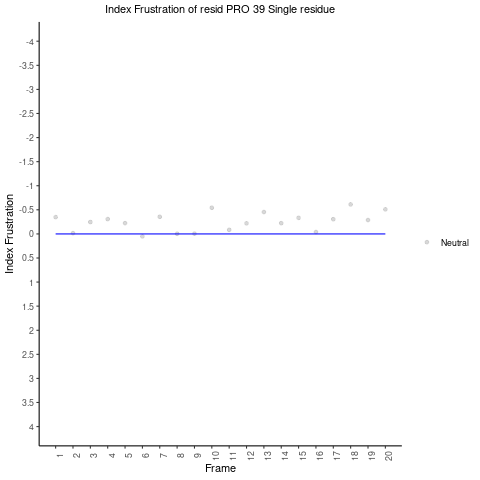

In [ ]:
%%R
library(frustratometeR)
# Visualization
plot_res_dynamics(Dynamic = Dynamic_sing, Resno = 39, Chain = "A")

#### Nueva Sección

In [ ]:
#### Generating the List las listas ####

import os

# Ruta de la carpeta que deseas explorar
ruta_carpeta = '/content/FoxP_NMR_'

# Obtener una lista de los nombres de archivo en la carpeta
nombres_archivos = os.listdir(ruta_carpeta)

# Imprime la ubicación actual
print(os.getcwd())

# Imprimir la lista de nombres de archivo
print(nombres_archivos)

/content/Results
['2kiu_18.pdb', '2kiu_15.pdb', '2kiu_16.pdb', '2kiu_13.pdb', '2kiu_1.pdb', '2kiu_9.pdb', '2kiu_20.pdb', '2kiu_6.pdb', '2kiu_12.pdb', '2kiu_4.pdb', '2kiu_3.pdb', '2kiu_19.pdb', '2kiu_5.pdb', '2kiu_2.pdb', '2kiu_8.pdb', '2kiu_17.pdb', '2kiu_14.pdb', '2kiu_10.pdb', '2kiu_7.pdb', '2kiu_11.pdb']


##The full path of the directory where the structures are located (PdbsDir), the order in which they will be analysed (OrderList, optional) and the desired frustration index (Mode) have to be passed as parameters:

In [ ]:
%%R
library("frustratometeR")
# Calculate frustration of Pdbs contained in PdbDir

PdbsDir <- ("/content/FoxP_NMR")      # Donde estan los PDBs guardados
#PdbsDir <- "/FoxP_NMR/"

ResultsDir <- ("/content/Results/")   # Donde se iran los resultados
#ResultsDir <- "/Results/"

#Dynamic_conf <- dynamic_frustration(PdbsDir = PdbsDir , ResultsDir = ResultsDir, Mode = "configurational")

# Calculate frustration of the Pdbs contained in PdbDir and indicated in OrderList

OrderList <- c('2kiu5.pdb', '2kiu3.pdb', '2kiu4.pdb', '2kiu9.pdb', '2kiu12.pdb', '2kiu18.pdb', '2kiu20.pdb', '2kiu17.pdb', '2kiu8.pdb', '2kiu15.pdb', '2kiu6.pdb', '2kiu14.pdb', '2kiu1.pdb', '2kiu2.pdb', '2kiu16.pdb', '2kiu19.pdb', '2kiu13.pdb', '2kiu10.pdb', '2kiu7.pdb', '2kiu11.pdb')

#Dynamic_conf <- dynamic_frustration(PdbsDir = "/content/FoxP_NMR/", ResultsDir = "/content/Results/")

# ?????????? #

Lo que pasa es que no logro que se genere ningun objeto de frustración dinamico usando el ordel list, entonces mi duda es esa ...


In [ ]:
%%R
library('frustratometeR')
#OrderList <- c()      #OrderList vector
#for(i in as.numeric(1):as.numeric(40)){OrderList <- c(OrderList, paste( i, ".pdb", sep = ""))}
Dynamic_conf <- dynamic_frustration(PdbsDir = PdbsDir , OrderList = OrderList, ResultsDir = ResultsDir)

# Analyzing residue Resno
Dynamic_conf <- dynamic_res(Dynamic = Dynamic_conf, Resno = 39, Chain = "A", Graphics = TRUE)


-----------------------------Object Dynamic Frustration-----------------------------
-----------------------------Calculating Dynamic Frustration-----------------------------
-----------------------------Filtering-----------------------------
-----------------------------Preparing files-----------------------------
-----------------------------Setting options-----------------------------
-----------------------------Calculating-----------------------------
-----------------------------Reorganization-----------------------------
-----------------------------Images-----------------------------
5Adens plot is stored in /content/Results/2kiu5.done/Images/2kiu5_configurational.png_5Adens.png
5Adens proportion plot is stored in /content/Results/2kiu5.done/Images/2kiu5_configurational_5Adens_around.png
Contact map is stored in /content/Results/2kiu5.done/Images/2kiu5_configurational_map.png
-----------------------------Visualizations-----------------------------


****Storage information****


## Ojo xon el models.log a veces hay que borrar algunas lineas

In [ ]:
!head /content/Results/2kiu3.done/FrustrationData/2kiu3.pdb_configurational_5adens

Res ChainRes Total nHighlyFrst nNeutrallyFrst nMinimallyFrst relHighlyFrustrated relNeutralFrustrated relMinimallyFrustrated
1 A 1 0 1 0 0 1 0
2 A 3 0 3 0 0 1 0
3 A 4 0 3 1 0 0.75 0.25
4 A 4 0 3 1 0 0.75 0.25
5 A 9 0 7 2 0 0.777777777777778 0.222222222222222
6 A 8 1 5 2 0.125 0.625 0.25
7 A 7 1 5 1 0.142857142857143 0.714285714285714 0.142857142857143
8 A 11 1 9 1 0.0909090909090909 0.818181818181818 0.0909090909090909
9 A 15 0 11 4 0 0.733333333333333 0.266666666666667


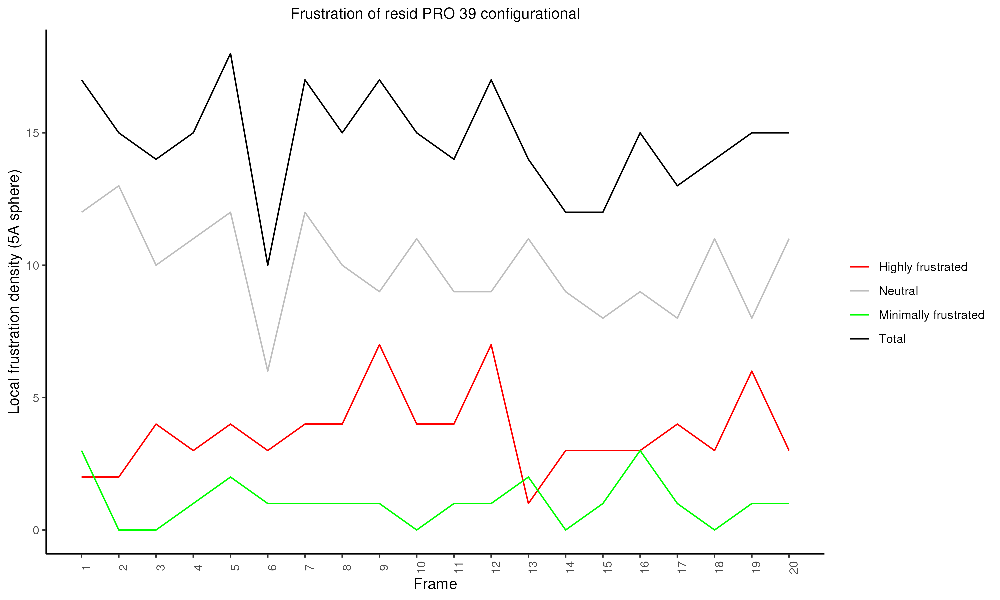

In [ ]:
from IPython.display import Image
Image('/content/Results/Dynamic_plots_res_39_A/dynamic5adens_configurational_Res39.png', width=700, height=400)

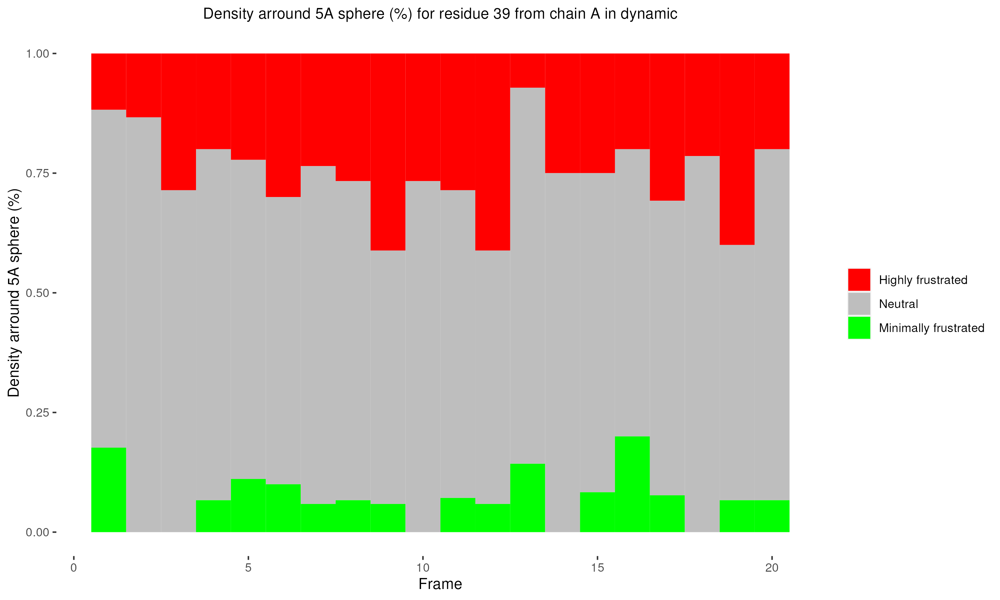

In [ ]:
from IPython.display import Image
Image('/content/Results/Dynamic_plots_res_39_A/dynamicHist5adens_configurational_Res_39_A.png', width=700, height=400)

In [ ]:
%%R
library('frustratometeR')

Dynamic_conf

$Mode
[1] "configurational"

$PdbsDir
[1] "/content/FoxP_NMR/"

$ResultsDir
[1] "/content/Results/"

$OrderList
 [1] "2kiu5.pdb"  "2kiu3.pdb"  "2kiu4.pdb"  "2kiu9.pdb"  "2kiu12.pdb"
 [6] "2kiu18.pdb" "2kiu20.pdb" "2kiu17.pdb" "2kiu8.pdb"  "2kiu15.pdb"
[11] "2kiu6.pdb"  "2kiu14.pdb" "2kiu1.pdb"  "2kiu2.pdb"  "2kiu16.pdb"
[16] "2kiu19.pdb" "2kiu13.pdb" "2kiu10.pdb" "2kiu7.pdb"  "2kiu11.pdb"

$SeqDist
[1] 12

$ResiduesDynamic
$ResiduesDynamic$A
$ResiduesDynamic$A$Res_39
[1] "/content/Results/Dynamic_plots_res_39_A/configurational_Res_39_A"





With the new **functionalities of the FrustraR** we can predict the frustration of a **point mutation** for all frustration modes (mutational, configurational and singleresidue) in a very easy way.


In [ ]:
#%%R
#help(calculate_frustration)

## With configurational or mutational modes.

-----------------------------Filtering-----------------------------
-----------------------------Preparing files-----------------------------
-----------------------------Setting options-----------------------------
-----------------------------Calculating-----------------------------
-----------------------------Reorganization-----------------------------
-----------------------------Images-----------------------------
5Adens plot is stored in /content/Results/2kiu_A.done/Images/2kiu_A_mutational.png_5Adens.png
5Adens proportion plot is stored in /content/Results/2kiu_A.done/Images/2kiu_A_mutational_5Adens_around.png
Contact map is stored in /content/Results/2kiu_A.done/Images/2kiu_A_mutational_map.png
-----------------------------Visualizations-----------------------------


****Storage information****
The frustration data was stored in /content/Results/2kiu_A.done/FrustrationData
Graphics are stored in /content/Results/2kiu_A.done/Images
Visualizations are stored in /content/Results

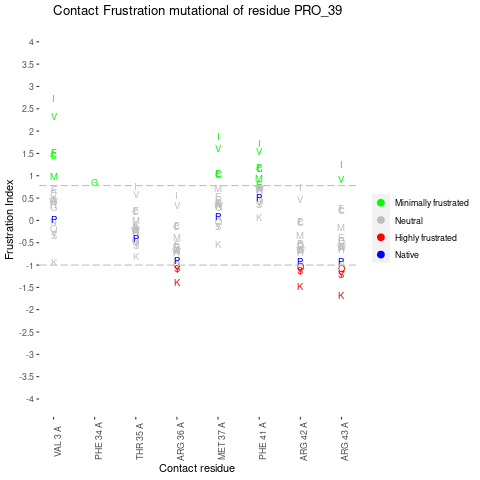

In [ ]:
%%R
library(frustratometeR)

Pdb_conf <- calculate_frustration(PdbFile = '/content/2kiu.pdb', Mode = 'mutational', ResultsDir = "/content/Results/", Chain="A")
Pdb_conf <- mutate_res(Pdb = Pdb_conf, Resno = as.numeric(39), Chain = "A")
plot_mutate_res(Pdb = Pdb_conf, Resno = as.numeric(39), Chain = "A", Save = TRUE )

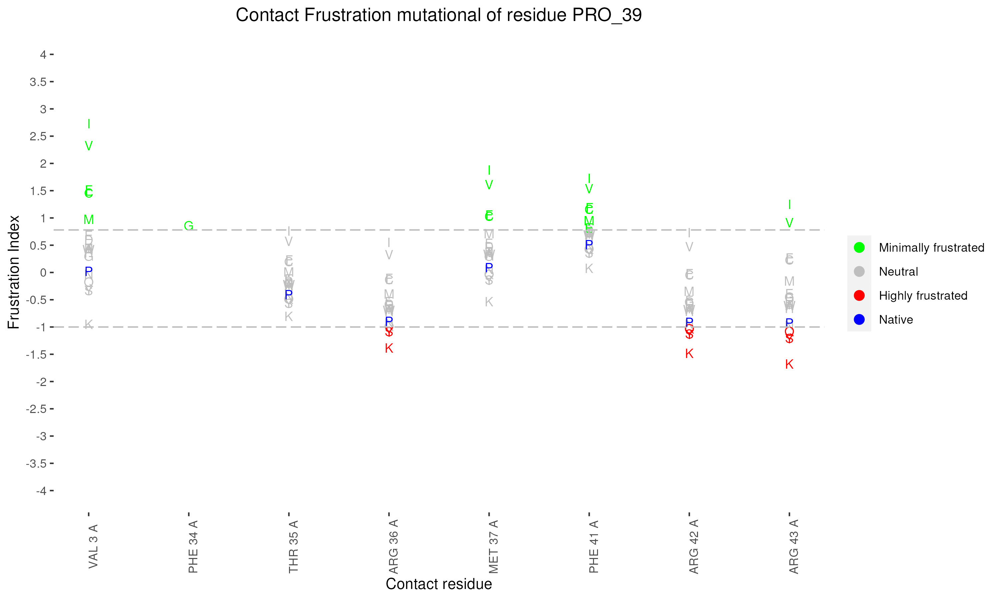

In [ ]:
from IPython.display import Image
Image('/content/Results/2kiu_A.done/MutationsData/Images/mutational_39_threading_A.png')



## The next will be understand how does the frustration of a residue change during the folding and refolding process?

Let's **create a folder named Dynamic** and download a zipped file containing frames from a **molecular dynamics simulation of RfaH protein folding**.

Let's download and unzip the frames (they are in .pdb format)

In [ ]:
#!gdown 1-jr_XQYzGWA-CGrdQjE6QjRjl1MO80nN -O /content/Dynamics.zip
!unzip /content/Dynamics.zip -d /content/

Archive:  /content/Dynamics.zip
  End-of-central-directory signature not found.  Either this file is not
  a zipfile, or it constitutes one disk of a multi-part archive.  In the
  latter case the central directory and zipfile comment will be found on
  the last disk(s) of this archive.
unzip:  cannot find zipfile directory in one of /content/Dynamics.zip or
        /content/Dynamics.zip.zip, and cannot find /content/Dynamics.zip.ZIP, period.


In [ ]:
#!touch /content/traj.pdb
#!rm /content/traj.pdb
#!for f in $(ls -1v /content/RfaH/*pdb); do (cat "${f}"; echo) >> /content/traj.pdb; done

#@title ###Visualize trajectory
#define number of frames


ls: cannot access '/content/RfaH/*pdb': No such file or directory


Cear un script de .r



In [ ]:
#%%R
#library('frustratometeR')
#OrderList <- c()      #OrderList vector
#for(i in as.numeric(1):as.numeric(40)){OrderList <- c(OrderList, paste( i, ".pdb", sep = ""))}
#Dynamic_conf <- dynamic_frustration(PdbsDir = "/content/" , OrderList = OrderList, ResultsDir = "/content/Results/")

# Analyzing residue Resno
#Dynamic_conf <- dynamic_res(Dynamic = Dynamic_conf, Resno = as.numeric(39), Chain = "A", Graphics = TRUE)

#Visualisations
#plot_dynamic_res_5Adens_proportion(Dynamic = Dynamic_conf, Resno = as.numeric(39), Chain = "A")

-----------------------------Object Dynamic Frustration-----------------------------
-----------------------------Calculating Dynamic Frustration-----------------------------


****Storage information****
The frustration of the full dynamic is stored in /content/Results/


  No input PDB file found: check filename




Error in read.pdb(paste(Dynamic$ResultsDir, basename.pdb(Dynamic$OrderList[1]),  : 
  No input PDB file found: check filename


RInterpreterError: ignored

In [ ]:
#from IPython.display import Image
#Image('/content/Dynamics/Results/Dynamic_plots_res_68_A/configurational_Res_68_A')
